# Sudoku Solver using Genetic Algorithms

In [1]:
import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

# For selection methods
from random import uniform, choice

# For the genetic operators
from random import randint, sample

## 1. Definition of the Problem

The objective of this project is to develop a Sudoku solver using Genetic Algorithms (GAs). Sudoku is a popular logic-based combinatorial number-placement puzzle. The goal is to fill a 9x9 grid with digits so that each column, each row, and each of the nine 3x3 subgrids (also called "boxes", "regions", or "blocks") contains all of the digits from 1 to 9. The puzzle starts with some cells already filled; the challenge is to complete the grid following the Sudoku rules.

This grid bellow represents a typical Sudoku puzzle with some numbers already filled in and others left blank (indicated by 0). We can use this puzzle as the initial state for your genetic algorithm to solve.

In [3]:
# Example of a Sudoku 
puzzle1 = [
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
]

# Solution
solved_puzzle = [
    [5, 3, 4, 6, 7, 8, 9, 1, 2],
    [6, 7, 2, 1, 9, 5, 3, 4, 8],
    [1, 9, 8, 3, 4, 2, 5, 6, 7],
    [8, 5, 9, 7, 6, 1, 4, 2, 3],
    [4, 2, 6, 8, 5, 3, 7, 9, 1],
    [7, 1, 3, 9, 2, 4, 8, 5, 6],
    [9, 6, 1, 5, 3, 7, 2, 8, 4],
    [2, 8, 7, 4, 1, 9, 6, 3, 5],
    [3, 4, 5, 2, 8, 6, 1, 7, 9]
]

## 2. Representation

In [31]:
class Population:
    def __init__(self, sudoku = None, population_size=500):
        """
        Initializes the Sudoku Genetic Algorithm solver.

        Parameters:
        sudoku (list of list of int): A 9x9 grid representing the Sudoku puzzle with pre-filled values (Defaults to None).
        population_size (int): The number of individuals in the population (Defaults to 500).
        """
        if sudoku is None: # Actions to be taken in case no Sudoku is given
            sudoku1 = SudokuGenerator() # Generates a Sudoku
            self.sudoku = sudoku1.get_sudoku_board() # The generated Sudoku grid with pre-filled values
        else:
            self.sudoku = sudoku  # The template Sudoku grid with pre-filled values
        self.population_size = population_size
        self.individuals = [self.generation_of_individuals() for _ in range(population_size)]
        
    def generation_of_individuals(self):
        individual = [row[:] for row in self.sudoku]  # Make a deep copy of the Sudoku grid
        for i in range(9):  # Iterate over each row
            for j in range(9):  # Iterate over each column
                if individual[i][j] == 0:  # Check if the cell is empty
                    individual[i][j] = random.randint(1, 9)  # Fill the cell with a random number from 1 to 9
        return individual


In [4]:
class SudokuGenerator:
    def __init__(self, base=3):
        # Initializes the base grid and generates the Sudoku board
        self.base = base
        self.side = base * base
        self.board = self.generate_board()

    def pattern(self, r, c):
        # Defines a baseline pattern to arrange numbers on the board based on row(r) and column(c). Ensuring that the Sudoku rules are followed.
        return (self.base * (r % self.base) + r // self.base + c) % self.side

    def shuffle(self, s):
        return random.sample(s, len(s))

    def generate_board(self):
        # Baseline pattern and shuffles rows, columns, and numbers to randomize the board.
        rBase = range(self.base)
        rows = [g * self.base + r for g in self.shuffle(rBase) for r in self.shuffle(rBase)]
        cols = [g * self.base + c for g in self.shuffle(rBase) for c in self.shuffle(rBase)]
        nums = self.shuffle(range(1, self.base * self.base + 1))

        # Produce a fully filled Sudoku board using randomized baseline pattern
        board = [[nums[self.pattern(r, c)] for c in cols] for r in rows]

        # Make 4/5 of the cells empty
        squares = self.side * self.side
        empties = squares * 4 // 5  # Only 17 cells will keep the original number
        for p in random.sample(range(squares), empties):
            board[p // self.side][p % self.side] = 0
        return board

    def get_sudoku_board(self):
        return self.board

## 3. Fitness Function

In [5]:
def fitness(individual):
    fitness = 0

    # Check conflicts in rows
    for row in range(9):
        row_set = set() # Use set to track duplicates
        for num in individual[row]:
            if num in row_set:
                fitness += 1 # Each duplicate found increases the fitness penalty by 1
            else:
                row_set.add(num)

    # Check conflicts in columns
    for column in range(9):
        column_set = set()
        for row in range(9):
            num = individual[row][column]
            if num in column_set:
                fitness += 1
            else:
                column_set.add(num)

    # Check conflicts in 3x3 subgrids
    for i in range(0, 9, 3):
        for j in range(0, 9, 3):
            block_set = set()
            for x in range(i, i + 3):
                for y in range(j, j + 3):
                    num = individual[x][y]
                    if num in block_set:
                        fitness += 1
                    else:
                        block_set.add(num)

    # Normalize fitness score to be between 0 and 1 
    max_conflicts = 3 * 9 * 9  # 3 checks (rows, columns, and blocks) times the number of cells
    normalized_fitness = 1 - (fitness / max_conflicts)
    
    return normalized_fitness

In [6]:
# Start the population with no sudoku
#population = Population()

# Start the population with a puzzle already given
population = Population()
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle1)}")
#print(f"The fitness of the solved puzzle is: {fitness(solved_puzzle)}")

The fitness of the puzzle is: 0.4814814814814815


## 4. Selection Methods

We aim to explore how different selection methods affect the genetic algorithm's (GA) performance. To ensure impartial evaluation, we've randomly chosen diverse combinations of crossover and mutation operators as additional hyperparameters. This strategy enables us to assess each selection method's influence on the GA's effectiveness across various configurations of genetic operators. By adopting this approach, we avoid limiting our analysis to a single set of crossover and mutation operators, allowing for a more comprehensive understanding of how different selection methods impact the algorithm's behavior.

### 4.1.  Fitness Proportional Selection (or 'roulette wheel')

In [7]:
def roulette_wheel_selection(population, fitness_values):
    # Total sum of fitness for the entire population
    total_fitness = sum(fitness_values)
    # Probability of each individual being selected
    selection_probs = [f / total_fitness for f in fitness_values]
    chosen_index = random.choices(range(len(population)), weights=selection_probs, k=1)[0]
    return population[chosen_index] # Return the individual at the selected index

In [49]:
def tournament_selection(population, fitness_values, tournament_size=100):
    # Randomly select a subset of tournament_size indices from the range of the population size
    selected_indices = random.sample(range(len(population)), tournament_size)
    selected_individuals = [(population[i], fitness_values[i]) for i in selected_indices]
    # Choose the individual with the highest fitness in the tournament
    best_individual = max(selected_individuals, key=lambda x: x[1])[0]
    return best_individual

In [9]:
def rank_selection(population, fitness_scores):
    """
    Select a single individual from the population based on ranking of their fitness scores.

    Args:
    - population: List of individuals in the current generation.
    - fitness_scores: List of fitness scores corresponding to the individuals in the population.

    Returns:
    - selected_individual: A single individual selected for reproduction.
    """

    # Pair individuals with their fitness scores and sort by fitness score, assuming higher scores are better
    ranked_population = sorted(zip(population, fitness_scores), key=lambda x: x[1], reverse=True)

    # Generate selection probabilities based on ranks (linear ranking)
    total_individuals = len(ranked_population)
    rank_probs = [(total_individuals - rank) / total_individuals for rank in range(total_individuals)]

    # Normalize probabilities
    total_prob = sum(rank_probs)
    normalized_probs = [prob / total_prob for prob in rank_probs]

    # Select a single individual based on the normalized probabilities
    selected_index = random.choices(range(total_individuals), weights=normalized_probs, k=1)[0]
    selected_individual = population[selected_index]

    return selected_individual

# Crossover

In [10]:
def row_crossover(parent1, parent2, template_sudoku=puzzle):
    child1, child2 = [row[:] for row in parent1], [row[:] for row in parent2]
    crossover_point = random.randint(1, 8)  # Choose a crossover point that is not at the edges

    for i in range(crossover_point, 9):
        if all(template_sudoku[i][j] == 0 for j in range(9)):  # Ensure the row can be fully swapped
                child1[i], child2[i] = child2[i][:], child1[i][:]

    return child1, child2

In [11]:
def single_column_crossover(parent1, parent2,template_sudoku=puzzle):
    child1, child2 = [row[:] for row in parent1], [row[:] for row in parent2]
    crossover_point = random.randint(0, 8)  # Choose a random column

        # Swap the selected column between two children, only if the template has an empty cell
    for i in range(9):
        if template_sudoku[i][crossover_point] == 0:
            child1[i][crossover_point], child2[i][crossover_point] = child2[i][crossover_point], child1[i][crossover_point]

    return child1, child2

In [12]:
def single_point_crossover(parent1, parent2, template=puzzle):
    """Perform single-point crossover on two 9x9 Sudoku grids.

    Args:
        parent1 (list): First parent Sudoku grid (list of lists).
        parent2 (list): Second parent Sudoku grid (list of lists).
        template (list): Sudoku grid template indicating immutable cells (0 indicates mutable).

    Returns:
        Two offspring Sudoku grids resulting from the crossover.
    """
    # Randomly choose a crossover point between 1 and 8
    crossover_point = randint(1, 8)

    # Initialize offspring grids as copies of the parents
    child1 = [row[:] for row in parent1]
    child2 = [row[:] for row in parent2]

    # Perform crossover respecting the template Sudoku
    for i in range(9):  # Iterate through each row
        if template[i][crossover_point] == 0:  # Check if the crossover point is mutable
            # Swap the sections of the rows after the crossover point
            (child1[i][crossover_point:], child2[i][crossover_point:]) = (
                parent2[i][crossover_point:], parent1[i][crossover_point:])

    return child1, child2

# Mutation

In [51]:
def swap_mutation(individual, mutation_type, template_sudoku=puzzle, mutation_rate=1):
    # Only mutate if the random check passes
    if random.random() < mutation_rate:
        if mutation_type == 'row': # Handle row mutation
            row = random.randint(0, 8)
            # Find indices of cells in the row that are empty in the template sudoku
            zero_indices = [j for j in range(9) if template_sudoku[row][j] == 0]
            if len(zero_indices) >= 2: # Ensure there are at least two empty cells to swap
                col1, col2 = random.sample(zero_indices, 2) # Randomly select two different columns
                # Swap the values
                individual[row][col1], individual[row][col2] = individual[row][col2], individual[row][col1]
        elif mutation_type == 'column': # Handle column mutation
            col = random.randint(0, 8)
            # Find indices of cells in the column that are empty in the template sudoku
            zero_indices = [i for i in range(9) if template_sudoku[i][col] == 0]
            if len(zero_indices) >= 2:
                row1, row2 = random.sample(zero_indices, 2)
                # Swap the values
                individual[row1][col], individual[row2][col] = individual[row2][col], individual[row1][col]
        else:  # Handle block mutation
            # Select a random 3x3 block
            block_row = random.randint(0, 2) * 3
            block_col = random.randint(0, 2) * 3
            positions = [(i, j) for i in range(block_row, block_row + 3) for j in range(block_col, block_col + 3) if template_sudoku[i][j] == 0]
            if len(positions) >= 2:
                (row1, col1), (row2, col2) = random.sample(positions, 2)
                # Swap the values
                individual[row1][col1], individual[row2][col2] = individual[row2][col2], individual[row1][col1]

    return individual

# Algorithm

In [14]:
def sudoku_algorithm(selection_method, crossover_method, mutation_method,mutation_type, GENERATION_SIZE):
    population = Population(puzzle)  # Initialize the population
    generation_max_fitness = []

    for generation in range(GENERATION_SIZE):
        fitness_values = [fitness(individual) for individual in population.individuals]
        new_population = []

        # Select parents separately
        for _ in range(len(population.individuals) // 2):
            parent1 = selection_method(population.individuals, fitness_values)
            parent2 = selection_method(population.individuals, fitness_values)
            # Create offspring via crossover
            offspring1, offspring2 = crossover_method(parent1, parent2)
            # Mutate offspring
            new_population.extend([mutation_method(offspring1,mutation_type), mutation_method(offspring2,mutation_type)])
        
        population.individuals = new_population
        # Re-evaluate fitness for the new population
        fitness_values = [fitness(individual) for individual in population.individuals]
        best_fitness = max(fitness_values)
        generation_max_fitness.append(best_fitness)
        print(f"Generation {generation}: Best Fitness = {best_fitness}")

    best_index = fitness_values.index(max(fitness_values))
    best_solution = population.individuals[best_index]
    print(best_solution)
    print(fitness(best_solution))

    return generation_max_fitness

# Example

In [ ]:
if __name__ == "__main__":
    fitness_scores= sudoku_algorithm(roulette_wheel_selection,row_crossover,swap_mutation,"column",300)

# Graphic only for an example configuration

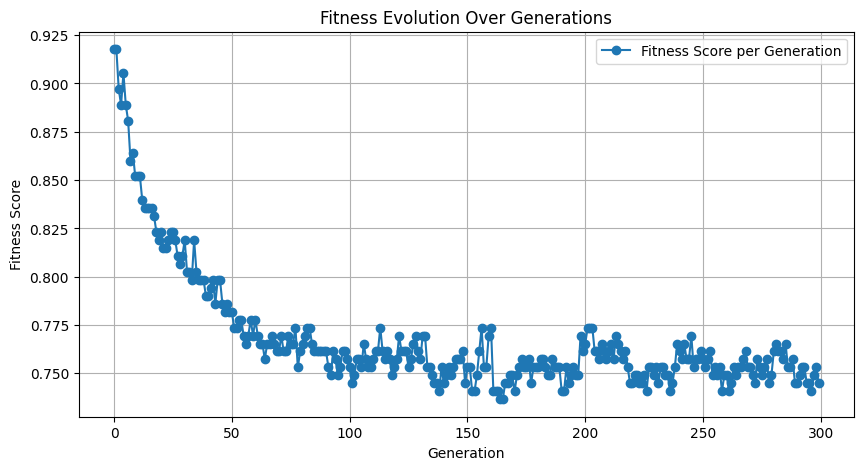

In [24]:
def plot_fitness_evolution(fitness_scores):
    plt.figure(figsize=(10, 5))
    plt.plot(fitness_scores, label='Fitness Score per Generation', marker='o')
    plt.title('Fitness Evolution Over Generations')
    plt.xlabel('Generation')
    plt.ylabel('Fitness Score')
    plt.grid(True)
    plt.legend()
    plt.show()

plot_fitness_evolution(fitness_scores)

In [50]:
def run_experiments():
    operator_configurations = [
(roulette_wheel_selection, row_crossover, swap_mutation, "row"),
(roulette_wheel_selection, row_crossover, swap_mutation, "column"),
(roulette_wheel_selection, row_crossover, swap_mutation, "block"),
(roulette_wheel_selection, single_column_crossover, swap_mutation, "row"),
(roulette_wheel_selection, single_column_crossover, swap_mutation, "column"),
(roulette_wheel_selection, single_column_crossover, swap_mutation, "block"),
(roulette_wheel_selection, single_point_crossover, swap_mutation, "row"),
(roulette_wheel_selection, single_point_crossover, swap_mutation, "column"),
(roulette_wheel_selection, single_point_crossover, swap_mutation, "block"),
(tournament_selection, row_crossover, swap_mutation, "row"),
(tournament_selection, row_crossover, swap_mutation, "column"),
(tournament_selection, row_crossover, swap_mutation, "block"),
(tournament_selection, single_column_crossover, swap_mutation, "row"),
(tournament_selection, single_column_crossover, swap_mutation, "column"),
(tournament_selection, single_column_crossover, swap_mutation, "block"),
(tournament_selection, single_point_crossover, swap_mutation, "row"),
(tournament_selection, single_point_crossover, swap_mutation, "column"),
(tournament_selection, single_point_crossover, swap_mutation, "block"),
(rank_selection, row_crossover, swap_mutation, "row"),
(rank_selection, row_crossover, swap_mutation, "column"),
(rank_selection, row_crossover, swap_mutation, "block"),
(rank_selection, single_column_crossover, swap_mutation, "row"),
(rank_selection, single_column_crossover, swap_mutation, "column"),
(rank_selection, single_column_crossover, swap_mutation, "block"),
(rank_selection, single_point_crossover, swap_mutation, "row"),
(rank_selection, single_point_crossover, swap_mutation, "column"),
(rank_selection, single_point_crossover, swap_mutation, "block")
        
    ]

    results = {}
    for i, (selection, crossover, mutation, mutation_type) in enumerate(operator_configurations):
        label = f'Config {i+1}: {selection.__name__}, {crossover.__name__}, {mutation.__name__} ({mutation_type})'
        fitness_scores = sudoku_algorithm(selection, crossover, mutation, mutation_type, 150) ############# GENERATION SIZE DEFINE HERE
        results[label] = fitness_scores
    return results

# Graphics with the chosen combinations example

In [ ]:
def plot_results(results):
    # Increase the figsize to make the plot bigger
    plt.figure(figsize=(30, 10))  # Adjust width and height to suit your needs
    for label, scores in results.items():
        plt.plot(scores, label=label)
    plt.title('Comparison of Genetic Operators')
    plt.xlabel('Generation')
    plt.ylabel('Fitness Score')

    # Move the legend to the outside of the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    
    # Adjust subplot parameters to give some more space for the outside legend
    plt.tight_layout(rect=[0, 0, 0.75, 1])  # Adjust the right margin to make room for the legend

    plt.show()
    
# Run experiments and plot results
results = run_experiments()
plot_results(results)

# 1st model Parameters

pop_size = 500, generation_size = 150, tournament_size = 100 , mutation_rate=1

## EASY DIFFICULTY PUZZLE

In [25]:
easy_sudoku = [
    [2, 6, 4, 0, 7, 3, 0, 5, 1],
    [9, 7, 5, 2, 1, 6, 4, 8, 3],
    [3, 8, 1, 5, 4, 0, 6, 0, 2],
    [5, 2, 9, 6, 3, 7, 1, 4, 8],
    [4, 1, 3, 0, 8, 5, 7, 2, 6],
    [6, 9, 7, 1, 2, 4, 8, 3, 5],
    [7, 0, 8, 3, 0, 2, 1, 6, 4],
    [1, 3, 2, 4, 6, 8, 5, 9, 0],
    [8, 4, 6, 7, 5, 0, 2, 3, 9]
]

In [26]:
# Start the population with a puzzle already given
population = Population(easy_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.9423868312757202


In [20]:
def plot_results(results):
    # Increase the figsize to make the plot bigger
    fig, ax = plt.subplots(figsize=(30, 10))  # Adjust width and height to suit your needs
    
    # Generate a color map that can provide as many unique colors as there are labels
    colors = plt.cm.get_cmap('tab20', len(results.keys()))
    
    for index, (label, scores) in enumerate(results.items()):
        ax.plot(scores, label=label, color=colors(index))
        
    ax.set_title('Comparison of Genetic Operators')
    ax.set_xlabel('Generation')
    ax.set_ylabel('Fitness Score')

    # Increase the number of ticks on the y-axis
    ax.yaxis.set_major_locator(MultipleLocator(0.01))  # Set the interval for major ticks

    # Move the legend to the outside of the plot
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.grid(True)
    
    # Adjust subplot parameters to give some more space for the outside legend
    plt.tight_layout(rect=[0, 0, 0.75, 1])  # Adjust the right margin to make room for the legend

    plt.show()
    return fig, ax

In [27]:
results = run_experiments()

Generation 0: Best Fitness = 0.9094650205761317
Generation 1: Best Fitness = 0.9053497942386831
Generation 2: Best Fitness = 0.9053497942386831
Generation 3: Best Fitness = 0.897119341563786
Generation 4: Best Fitness = 0.897119341563786
Generation 5: Best Fitness = 0.8888888888888888
Generation 6: Best Fitness = 0.8888888888888888
Generation 7: Best Fitness = 0.8847736625514403
Generation 8: Best Fitness = 0.8765432098765432
Generation 9: Best Fitness = 0.8724279835390947
Generation 10: Best Fitness = 0.8641975308641976
Generation 11: Best Fitness = 0.868312757201646
Generation 12: Best Fitness = 0.868312757201646
Generation 13: Best Fitness = 0.8559670781893004
Generation 14: Best Fitness = 0.8600823045267489
Generation 15: Best Fitness = 0.8600823045267489
Generation 16: Best Fitness = 0.8600823045267489
Generation 17: Best Fitness = 0.8600823045267489
Generation 18: Best Fitness = 0.868312757201646
Generation 19: Best Fitness = 0.8641975308641976
Generation 20: Best Fitness = 0.855

C:\Users\jgonc\AppData\Local\Temp\ipykernel_27292\1099802353.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


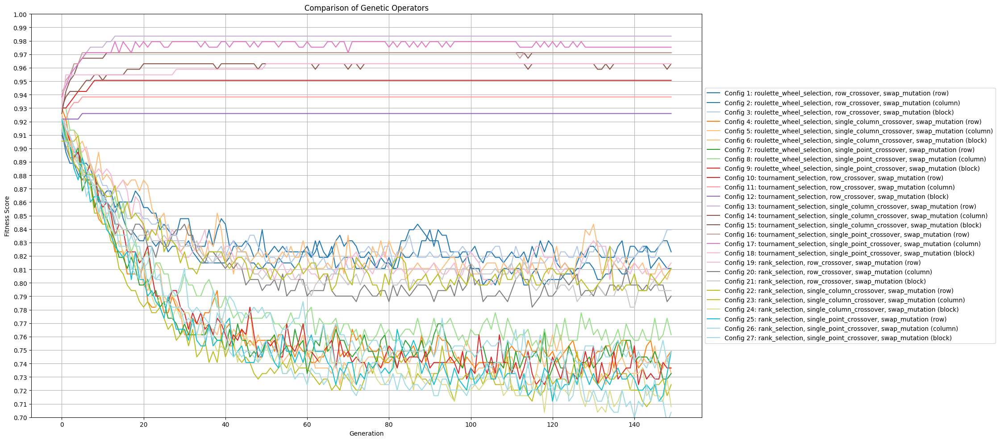

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [34]:
plot_results(results)

## MEDIUM DIFFICULTY PUZZLE 

In [35]:
medium_sudoku = [
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
]


In [36]:
# Start the population with a puzzle already given
population = Population(medium_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.4814814814814815


In [37]:
results = run_experiments()

Generation 0: Best Fitness = 0.7530864197530864
Generation 1: Best Fitness = 0.7489711934156378
Generation 2: Best Fitness = 0.7325102880658436
Generation 3: Best Fitness = 0.7325102880658436
Generation 4: Best Fitness = 0.7283950617283951
Generation 5: Best Fitness = 0.7407407407407407
Generation 6: Best Fitness = 0.7325102880658436
Generation 7: Best Fitness = 0.7325102880658436
Generation 8: Best Fitness = 0.7283950617283951
Generation 9: Best Fitness = 0.7325102880658436
Generation 10: Best Fitness = 0.7325102880658436
Generation 11: Best Fitness = 0.7283950617283951
Generation 12: Best Fitness = 0.7366255144032922
Generation 13: Best Fitness = 0.7366255144032922
Generation 14: Best Fitness = 0.7366255144032922
Generation 15: Best Fitness = 0.7242798353909465
Generation 16: Best Fitness = 0.7283950617283951
Generation 17: Best Fitness = 0.7242798353909465
Generation 18: Best Fitness = 0.7242798353909465
Generation 19: Best Fitness = 0.7283950617283951
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_27292\1099802353.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


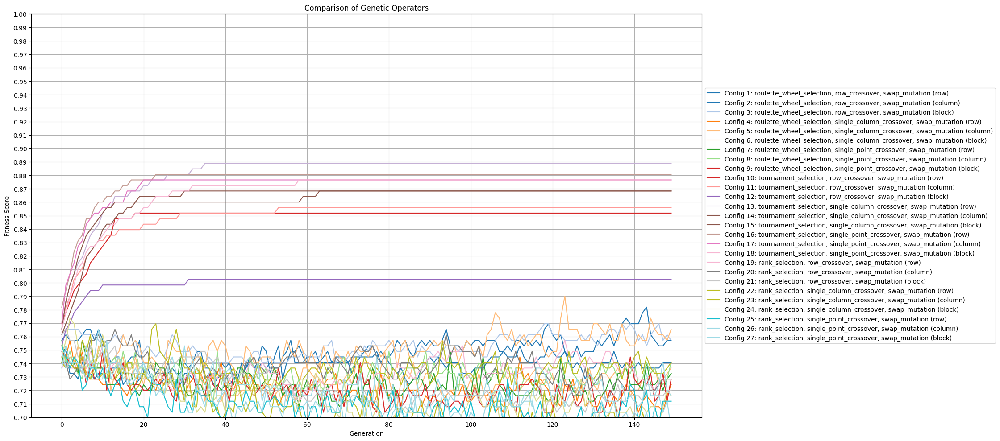

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [38]:
plot_results(results)

## HARD DIFFICULTY PUZZLE

In [39]:
difficult_sudoku = [
    [8, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 3, 6, 0, 0, 0, 0, 0],
    [0, 7, 0, 0, 9, 0, 2, 0, 0],
    [0, 5, 0, 0, 0, 7, 0, 0, 0],
    [0, 0, 0, 0, 4, 5, 7, 0, 0],
    [0, 0, 0, 1, 0, 0, 0, 3, 0],
    [0, 0, 1, 0, 0, 0, 0, 6, 8],
    [0, 0, 8, 5, 0, 0, 0, 1, 0],
    [0, 9, 0, 0, 0, 0, 4, 0, 0]
]

In [40]:
# Start the population with a puzzle already given
population = Population(difficult_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.37037037037037035


In [41]:
results = run_experiments()

Generation 0: Best Fitness = 0.7242798353909465
Generation 1: Best Fitness = 0.7160493827160495
Generation 2: Best Fitness = 0.7242798353909465
Generation 3: Best Fitness = 0.7242798353909465
Generation 4: Best Fitness = 0.7201646090534979
Generation 5: Best Fitness = 0.7201646090534979
Generation 6: Best Fitness = 0.7242798353909465
Generation 7: Best Fitness = 0.7283950617283951
Generation 8: Best Fitness = 0.7283950617283951
Generation 9: Best Fitness = 0.7325102880658436
Generation 10: Best Fitness = 0.7242798353909465
Generation 11: Best Fitness = 0.7242798353909465
Generation 12: Best Fitness = 0.7160493827160495
Generation 13: Best Fitness = 0.7160493827160495
Generation 14: Best Fitness = 0.7119341563786008
Generation 15: Best Fitness = 0.7242798353909465
Generation 16: Best Fitness = 0.7160493827160495
Generation 17: Best Fitness = 0.7160493827160495
Generation 18: Best Fitness = 0.7160493827160495
Generation 19: Best Fitness = 0.7119341563786008
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_27292\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


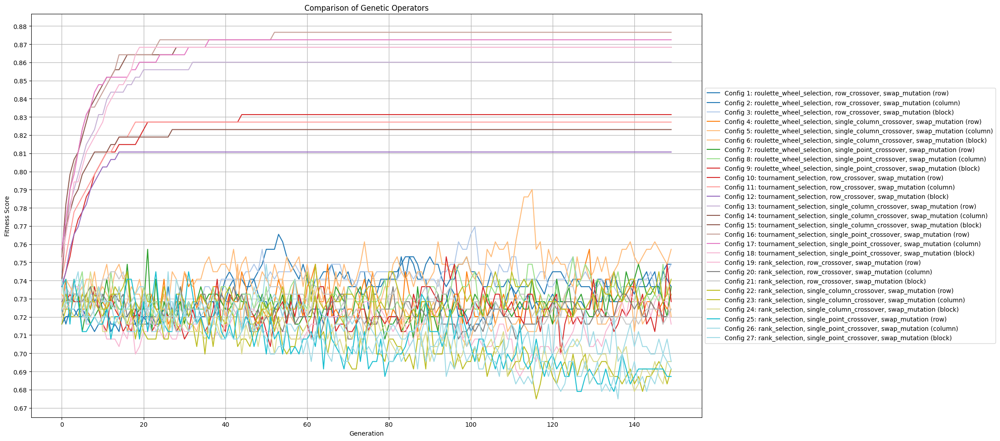

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [43]:
plot_results(results)

# 2nd model Parameters

pop_size = 1000, generation_size = 150, tournament_size = 100, mutation_rate=1 (pop_size changed from 500 to 1000 from the first model)

## EASY DIFFICULTY PUZZLE

In [16]:
easy_sudoku = [
    [2, 6, 4, 0, 7, 3, 0, 5, 1],
    [9, 7, 5, 2, 1, 6, 4, 8, 3],
    [3, 8, 1, 5, 4, 0, 6, 0, 2],
    [5, 2, 9, 6, 3, 7, 1, 4, 8],
    [4, 1, 3, 0, 8, 5, 7, 2, 6],
    [6, 9, 7, 1, 2, 4, 8, 3, 5],
    [7, 0, 8, 3, 0, 2, 1, 6, 4],
    [1, 3, 2, 4, 6, 8, 5, 9, 0],
    [8, 4, 6, 7, 5, 0, 2, 3, 9]
]

In [17]:
# Start the population with a puzzle already given
population = Population(easy_sudoku,1000)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.9423868312757202


In [18]:
results = run_experiments()

Generation 0: Best Fitness = 0.9259259259259259
Generation 1: Best Fitness = 0.9218106995884774
Generation 2: Best Fitness = 0.9176954732510288
Generation 3: Best Fitness = 0.9176954732510288
Generation 4: Best Fitness = 0.9094650205761317
Generation 5: Best Fitness = 0.9012345679012346
Generation 6: Best Fitness = 0.8888888888888888
Generation 7: Best Fitness = 0.8888888888888888
Generation 8: Best Fitness = 0.8806584362139918
Generation 9: Best Fitness = 0.8847736625514403
Generation 10: Best Fitness = 0.8806584362139918
Generation 11: Best Fitness = 0.8847736625514403
Generation 12: Best Fitness = 0.8806584362139918
Generation 13: Best Fitness = 0.868312757201646
Generation 14: Best Fitness = 0.8641975308641976
Generation 15: Best Fitness = 0.868312757201646
Generation 16: Best Fitness = 0.8641975308641976
Generation 17: Best Fitness = 0.868312757201646
Generation 18: Best Fitness = 0.8765432098765432
Generation 19: Best Fitness = 0.8806584362139918
Generation 20: Best Fitness = 0.8

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


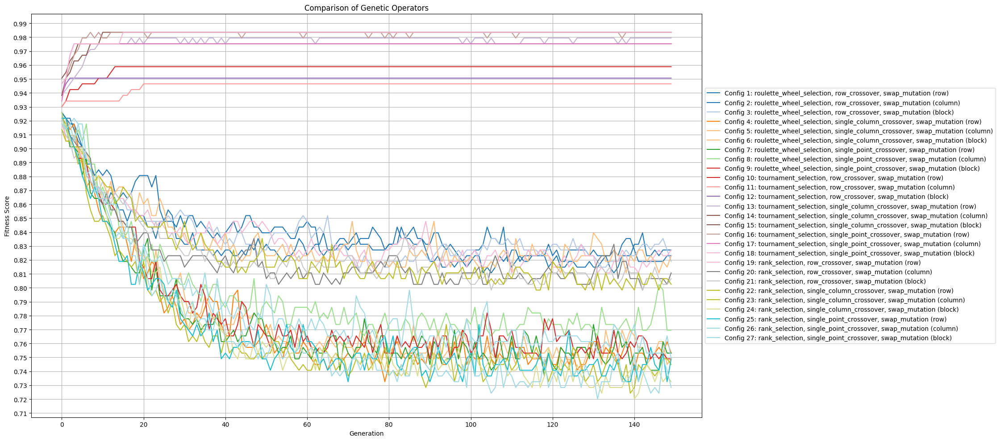

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [21]:
plot_results(results)

## MEDIUM DIFFICULTY PUZZLE 

In [22]:
medium_sudoku = [
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
]


In [23]:
# Start the population with a puzzle already given
population = Population(medium_sudoku,1000)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.4814814814814815


In [24]:
results = run_experiments()

Generation 0: Best Fitness = 0.7489711934156378
Generation 1: Best Fitness = 0.7448559670781894
Generation 2: Best Fitness = 0.7530864197530864
Generation 3: Best Fitness = 0.7448559670781894
Generation 4: Best Fitness = 0.7448559670781894
Generation 5: Best Fitness = 0.7448559670781894
Generation 6: Best Fitness = 0.7489711934156378
Generation 7: Best Fitness = 0.7530864197530864
Generation 8: Best Fitness = 0.7489711934156378
Generation 9: Best Fitness = 0.757201646090535
Generation 10: Best Fitness = 0.757201646090535
Generation 11: Best Fitness = 0.757201646090535
Generation 12: Best Fitness = 0.7489711934156378
Generation 13: Best Fitness = 0.7530864197530864
Generation 14: Best Fitness = 0.7489711934156378
Generation 15: Best Fitness = 0.7530864197530864
Generation 16: Best Fitness = 0.7530864197530864
Generation 17: Best Fitness = 0.7530864197530864
Generation 18: Best Fitness = 0.7654320987654322
Generation 19: Best Fitness = 0.7530864197530864
Generation 20: Best Fitness = 0.7

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


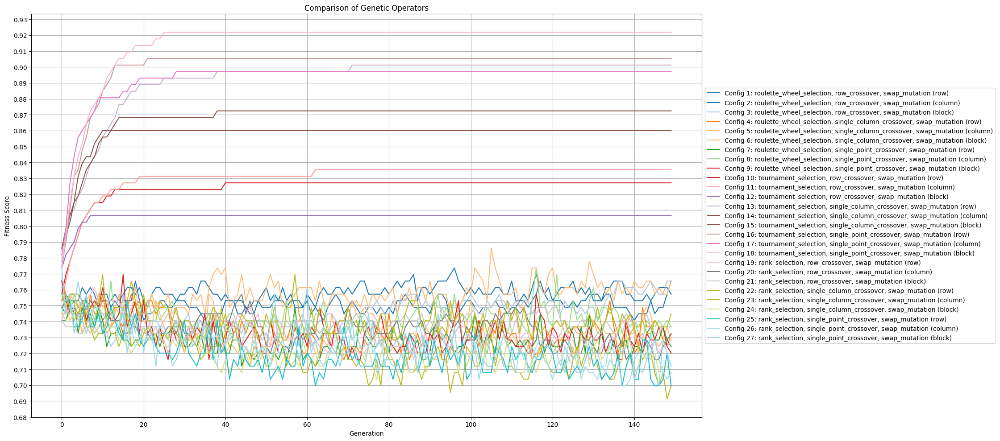

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [25]:
plot_results(results)

## HARD DIFFICULTY PUZZLE

In [26]:
difficult_sudoku = [
    [8, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 3, 6, 0, 0, 0, 0, 0],
    [0, 7, 0, 0, 9, 0, 2, 0, 0],
    [0, 5, 0, 0, 0, 7, 0, 0, 0],
    [0, 0, 0, 0, 4, 5, 7, 0, 0],
    [0, 0, 0, 1, 0, 0, 0, 3, 0],
    [0, 0, 1, 0, 0, 0, 0, 6, 8],
    [0, 0, 8, 5, 0, 0, 0, 1, 0],
    [0, 9, 0, 0, 0, 0, 4, 0, 0]
]

In [27]:
# Start the population with a puzzle already given
population = Population(difficult_sudoku,1000)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.37037037037037035


In [28]:
results = run_experiments()

Generation 0: Best Fitness = 0.7283950617283951
Generation 1: Best Fitness = 0.7283950617283951
Generation 2: Best Fitness = 0.7283950617283951
Generation 3: Best Fitness = 0.7325102880658436
Generation 4: Best Fitness = 0.7325102880658436
Generation 5: Best Fitness = 0.7366255144032922
Generation 6: Best Fitness = 0.7407407407407407
Generation 7: Best Fitness = 0.7325102880658436
Generation 8: Best Fitness = 0.7325102880658436
Generation 9: Best Fitness = 0.7325102880658436
Generation 10: Best Fitness = 0.7283950617283951
Generation 11: Best Fitness = 0.7366255144032922
Generation 12: Best Fitness = 0.7448559670781894
Generation 13: Best Fitness = 0.7407407407407407
Generation 14: Best Fitness = 0.7407407407407407
Generation 15: Best Fitness = 0.7489711934156378
Generation 16: Best Fitness = 0.7407407407407407
Generation 17: Best Fitness = 0.7366255144032922
Generation 18: Best Fitness = 0.7407407407407407
Generation 19: Best Fitness = 0.7366255144032922
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


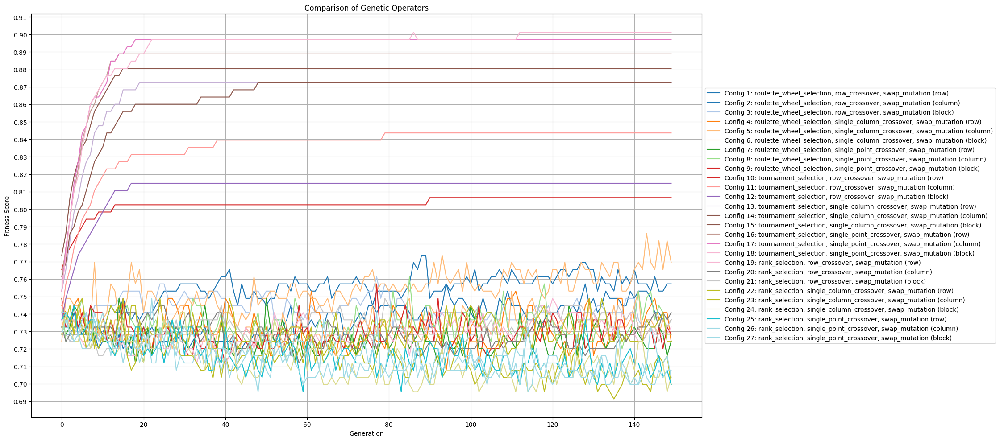

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [29]:
plot_results(results)

# 3rd model Parameters

pop_size = 500, generation_size = 150, tournament_size = 250, mutation_rate=1 (tournament_size only applies to tournament_selection method so only configurations with tournament_selection method will be tested) (increased tournament_size from 100 to 250)

## EASY DIFFICULTY PUZZLE

In [33]:
easy_sudoku = [
    [2, 6, 4, 0, 7, 3, 0, 5, 1],
    [9, 7, 5, 2, 1, 6, 4, 8, 3],
    [3, 8, 1, 5, 4, 0, 6, 0, 2],
    [5, 2, 9, 6, 3, 7, 1, 4, 8],
    [4, 1, 3, 0, 8, 5, 7, 2, 6],
    [6, 9, 7, 1, 2, 4, 8, 3, 5],
    [7, 0, 8, 3, 0, 2, 1, 6, 4],
    [1, 3, 2, 4, 6, 8, 5, 9, 0],
    [8, 4, 6, 7, 5, 0, 2, 3, 9]
]

In [34]:
# Start the population with a puzzle already given
population = Population(easy_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.9423868312757202


In [38]:
def run_experiments2():
    operator_configurations = [
(tournament_selection, row_crossover, swap_mutation, "row"),
(tournament_selection, row_crossover, swap_mutation, "column"),
(tournament_selection, row_crossover, swap_mutation, "block"),
(tournament_selection, single_column_crossover, swap_mutation, "row"),
(tournament_selection, single_column_crossover, swap_mutation, "column"),
(tournament_selection, single_column_crossover, swap_mutation, "block"),
(tournament_selection, single_point_crossover, swap_mutation, "row"),
(tournament_selection, single_point_crossover, swap_mutation, "column"),
(tournament_selection, single_point_crossover, swap_mutation, "block") 
        
    ]

    results = {}
    for i, (selection, crossover, mutation, mutation_type) in enumerate(operator_configurations):
        label = f'Config {i+1}: {selection.__name__}, {crossover.__name__}, {mutation.__name__} ({mutation_type})'
        fitness_scores = sudoku_algorithm(selection, crossover, mutation, mutation_type, 150) # define here the generation_size 
        results[label] = fitness_scores
    return results

In [39]:
results = run_experiments2()

Generation 0: Best Fitness = 0.9300411522633745
Generation 1: Best Fitness = 0.934156378600823
Generation 2: Best Fitness = 0.9382716049382716
Generation 3: Best Fitness = 0.9423868312757202
Generation 4: Best Fitness = 0.9423868312757202
Generation 5: Best Fitness = 0.9423868312757202
Generation 6: Best Fitness = 0.9423868312757202
Generation 7: Best Fitness = 0.9423868312757202
Generation 8: Best Fitness = 0.9423868312757202
Generation 9: Best Fitness = 0.9423868312757202
Generation 10: Best Fitness = 0.9465020576131687
Generation 11: Best Fitness = 0.9465020576131687
Generation 12: Best Fitness = 0.9465020576131687
Generation 13: Best Fitness = 0.9465020576131687
Generation 14: Best Fitness = 0.9465020576131687
Generation 15: Best Fitness = 0.9465020576131687
Generation 16: Best Fitness = 0.9465020576131687
Generation 17: Best Fitness = 0.9465020576131687
Generation 18: Best Fitness = 0.9465020576131687
Generation 19: Best Fitness = 0.9465020576131687
Generation 20: Best Fitness = 0

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


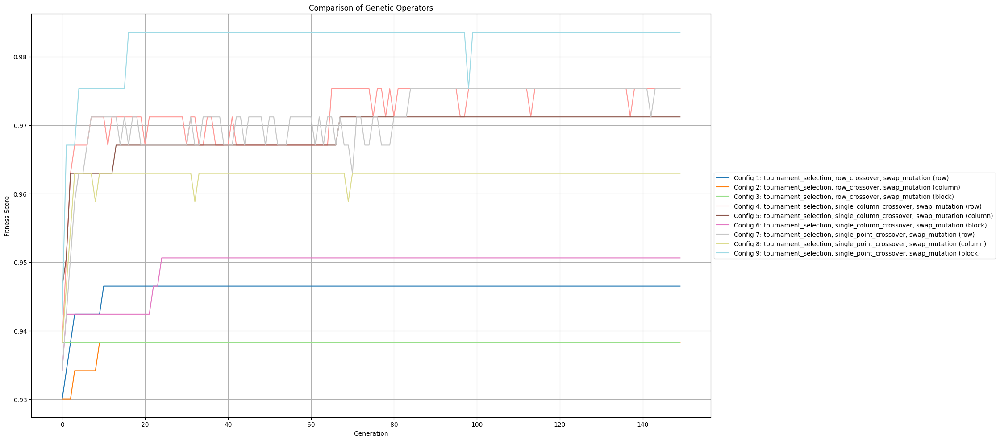

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [40]:
plot_results(results)

## MEDIUM DIFFICULTY PUZZLE 

In [41]:
medium_sudoku = [
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
]


In [42]:
# Start the population with a puzzle already given
population = Population(medium_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.4814814814814815


In [43]:
results = run_experiments2()

Generation 0: Best Fitness = 0.7736625514403292
Generation 1: Best Fitness = 0.7818930041152263
Generation 2: Best Fitness = 0.7901234567901234
Generation 3: Best Fitness = 0.7983539094650206
Generation 4: Best Fitness = 0.8065843621399177
Generation 5: Best Fitness = 0.8148148148148149
Generation 6: Best Fitness = 0.8189300411522633
Generation 7: Best Fitness = 0.8271604938271605
Generation 8: Best Fitness = 0.831275720164609
Generation 9: Best Fitness = 0.8353909465020576
Generation 10: Best Fitness = 0.8353909465020576
Generation 11: Best Fitness = 0.8395061728395061
Generation 12: Best Fitness = 0.8395061728395061
Generation 13: Best Fitness = 0.8395061728395061
Generation 14: Best Fitness = 0.8395061728395061
Generation 15: Best Fitness = 0.8436213991769548
Generation 16: Best Fitness = 0.8436213991769548
Generation 17: Best Fitness = 0.8436213991769548
Generation 18: Best Fitness = 0.8436213991769548
Generation 19: Best Fitness = 0.8436213991769548
Generation 20: Best Fitness = 0

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


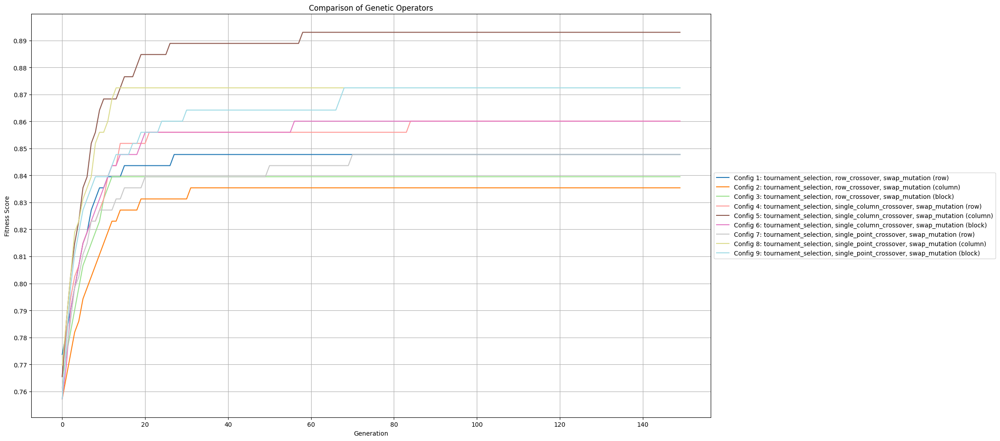

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [44]:
plot_results(results)

## HARD DIFFICULTY PUZZLE

In [45]:
difficult_sudoku = [
    [8, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 3, 6, 0, 0, 0, 0, 0],
    [0, 7, 0, 0, 9, 0, 2, 0, 0],
    [0, 5, 0, 0, 0, 7, 0, 0, 0],
    [0, 0, 0, 0, 4, 5, 7, 0, 0],
    [0, 0, 0, 1, 0, 0, 0, 3, 0],
    [0, 0, 1, 0, 0, 0, 0, 6, 8],
    [0, 0, 8, 5, 0, 0, 0, 1, 0],
    [0, 9, 0, 0, 0, 0, 4, 0, 0]
]

In [46]:
# Start the population with a puzzle already given
population = Population(difficult_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.37037037037037035


In [47]:
results = run_experiments2()

Generation 0: Best Fitness = 0.7530864197530864
Generation 1: Best Fitness = 0.7654320987654322
Generation 2: Best Fitness = 0.7777777777777778
Generation 3: Best Fitness = 0.7901234567901234
Generation 4: Best Fitness = 0.8024691358024691
Generation 5: Best Fitness = 0.8106995884773662
Generation 6: Best Fitness = 0.8189300411522633
Generation 7: Best Fitness = 0.823045267489712
Generation 8: Best Fitness = 0.8271604938271605
Generation 9: Best Fitness = 0.8353909465020576
Generation 10: Best Fitness = 0.8353909465020576
Generation 11: Best Fitness = 0.8395061728395061
Generation 12: Best Fitness = 0.8395061728395061
Generation 13: Best Fitness = 0.8395061728395061
Generation 14: Best Fitness = 0.8395061728395061
Generation 15: Best Fitness = 0.8436213991769548
Generation 16: Best Fitness = 0.8436213991769548
Generation 17: Best Fitness = 0.8436213991769548
Generation 18: Best Fitness = 0.8436213991769548
Generation 19: Best Fitness = 0.8436213991769548
Generation 20: Best Fitness = 0

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


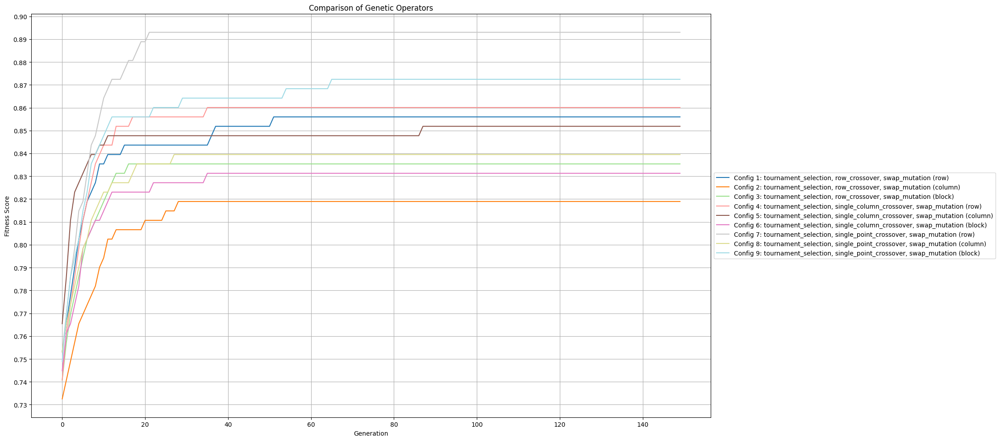

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [48]:
plot_results(results)

# 4th model Parameters

pop_size = 500, generation_size = 150, tournament_size = 100, mutation_rate=0.1 (mutation_rate changed from 1 to 0.1)

## EASY DIFFICULTY PUZZLE

In [52]:
easy_sudoku = [
    [2, 6, 4, 0, 7, 3, 0, 5, 1],
    [9, 7, 5, 2, 1, 6, 4, 8, 3],
    [3, 8, 1, 5, 4, 0, 6, 0, 2],
    [5, 2, 9, 6, 3, 7, 1, 4, 8],
    [4, 1, 3, 0, 8, 5, 7, 2, 6],
    [6, 9, 7, 1, 2, 4, 8, 3, 5],
    [7, 0, 8, 3, 0, 2, 1, 6, 4],
    [1, 3, 2, 4, 6, 8, 5, 9, 0],
    [8, 4, 6, 7, 5, 0, 2, 3, 9]
]

In [53]:
# Start the population with a puzzle already given
population = Population(easy_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.9423868312757202


In [54]:
results = run_experiments()

Generation 0: Best Fitness = 0.9259259259259259
Generation 1: Best Fitness = 0.9259259259259259
Generation 2: Best Fitness = 0.9176954732510288
Generation 3: Best Fitness = 0.9176954732510288
Generation 4: Best Fitness = 0.9176954732510288
Generation 5: Best Fitness = 0.9176954732510288
Generation 6: Best Fitness = 0.9135802469135803
Generation 7: Best Fitness = 0.9135802469135803
Generation 8: Best Fitness = 0.9094650205761317
Generation 9: Best Fitness = 0.9094650205761317
Generation 10: Best Fitness = 0.9094650205761317
Generation 11: Best Fitness = 0.9094650205761317
Generation 12: Best Fitness = 0.9094650205761317
Generation 13: Best Fitness = 0.9094650205761317
Generation 14: Best Fitness = 0.9094650205761317
Generation 15: Best Fitness = 0.9094650205761317
Generation 16: Best Fitness = 0.9094650205761317
Generation 17: Best Fitness = 0.9094650205761317
Generation 18: Best Fitness = 0.9094650205761317
Generation 19: Best Fitness = 0.9094650205761317
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


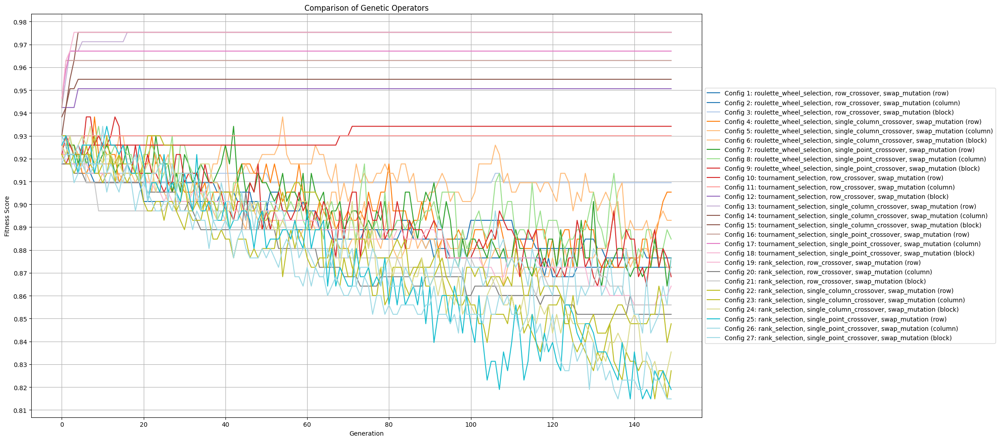

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [55]:
plot_results(results)

## MEDIUM DIFFICULTY PUZZLE 

In [56]:
medium_sudoku = [
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
]


In [57]:
# Start the population with a puzzle already given
population = Population(medium_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.4814814814814815


In [58]:
results = run_experiments()

Generation 0: Best Fitness = 0.7530864197530864
Generation 1: Best Fitness = 0.7407407407407407
Generation 2: Best Fitness = 0.7366255144032922
Generation 3: Best Fitness = 0.7366255144032922
Generation 4: Best Fitness = 0.7366255144032922
Generation 5: Best Fitness = 0.7407407407407407
Generation 6: Best Fitness = 0.7407407407407407
Generation 7: Best Fitness = 0.7366255144032922
Generation 8: Best Fitness = 0.7407407407407407
Generation 9: Best Fitness = 0.7407407407407407
Generation 10: Best Fitness = 0.7448559670781894
Generation 11: Best Fitness = 0.7407407407407407
Generation 12: Best Fitness = 0.7407407407407407
Generation 13: Best Fitness = 0.7407407407407407
Generation 14: Best Fitness = 0.7407407407407407
Generation 15: Best Fitness = 0.7407407407407407
Generation 16: Best Fitness = 0.7407407407407407
Generation 17: Best Fitness = 0.7489711934156378
Generation 18: Best Fitness = 0.7407407407407407
Generation 19: Best Fitness = 0.7407407407407407
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


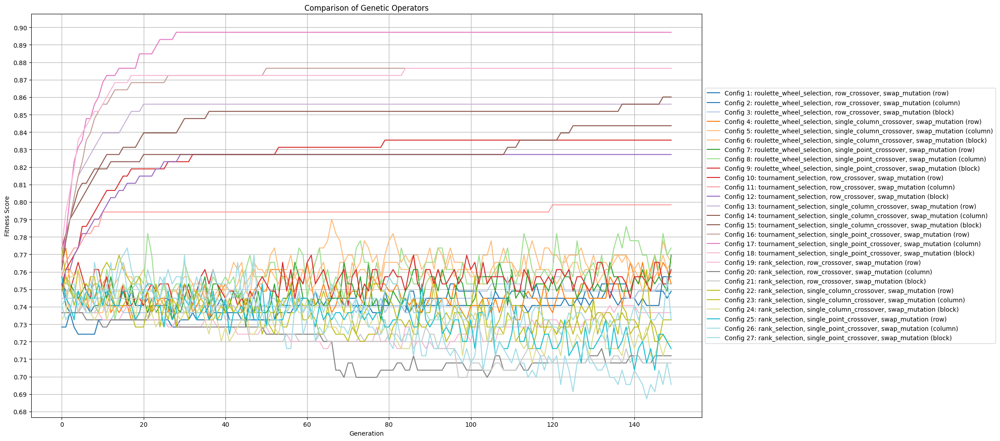

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [59]:
plot_results(results)

## HARD DIFFICULTY PUZZLE

In [60]:
difficult_sudoku = [
    [8, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 3, 6, 0, 0, 0, 0, 0],
    [0, 7, 0, 0, 9, 0, 2, 0, 0],
    [0, 5, 0, 0, 0, 7, 0, 0, 0],
    [0, 0, 0, 0, 4, 5, 7, 0, 0],
    [0, 0, 0, 1, 0, 0, 0, 3, 0],
    [0, 0, 1, 0, 0, 0, 0, 6, 8],
    [0, 0, 8, 5, 0, 0, 0, 1, 0],
    [0, 9, 0, 0, 0, 0, 4, 0, 0]
]

In [61]:
# Start the population with a puzzle already given
population = Population(difficult_sudoku)
puzzle = population.sudoku
print(f"The fitness of the puzzle is: {fitness(puzzle)}")

The fitness of the puzzle is: 0.37037037037037035


In [62]:
results = run_experiments()

Generation 0: Best Fitness = 0.7119341563786008
Generation 1: Best Fitness = 0.7119341563786008
Generation 2: Best Fitness = 0.7119341563786008
Generation 3: Best Fitness = 0.7119341563786008
Generation 4: Best Fitness = 0.7119341563786008
Generation 5: Best Fitness = 0.7119341563786008
Generation 6: Best Fitness = 0.7119341563786008
Generation 7: Best Fitness = 0.7119341563786008
Generation 8: Best Fitness = 0.7119341563786008
Generation 9: Best Fitness = 0.7119341563786008
Generation 10: Best Fitness = 0.7160493827160495
Generation 11: Best Fitness = 0.7160493827160495
Generation 12: Best Fitness = 0.7160493827160495
Generation 13: Best Fitness = 0.7160493827160495
Generation 14: Best Fitness = 0.7160493827160495
Generation 15: Best Fitness = 0.7160493827160495
Generation 16: Best Fitness = 0.7160493827160495
Generation 17: Best Fitness = 0.7119341563786008
Generation 18: Best Fitness = 0.7119341563786008
Generation 19: Best Fitness = 0.7119341563786008
Generation 20: Best Fitness = 

C:\Users\jgonc\AppData\Local\Temp\ipykernel_31776\48550670.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(results.keys()))


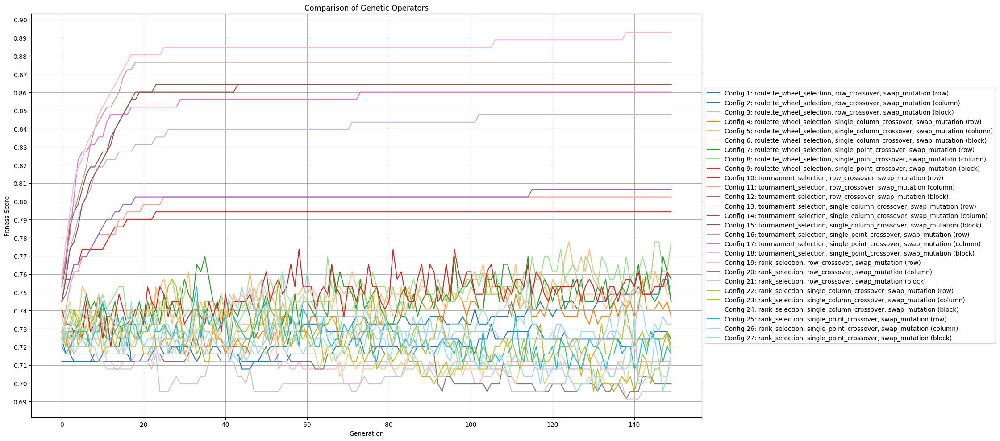

(<Figure size 3000x1000 with 1 Axes>,
 <Axes: title={'center': 'Comparison of Genetic Operators'}, xlabel='Generation', ylabel='Fitness Score'>)

In [63]:
plot_results(results)